In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sn
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.cm as cm

from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,cohen_kappa_score,roc_auc_score,confusion_matrix, classification_report
#from imgaug import augmenters as iaa

import keras
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.layers import Dropout, Dense, Input, GlobalAveragePooling2D, GlobalMaxPooling2D
from tensorflow.keras.layers import Layer, Conv2D, Flatten, BatchNormalization, Concatenate, Multiply, Average
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical, plot_model

# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) `tensorflow` random seed
# 3) `python` random seed
keras.utils.set_random_seed(813)

# This will make TensorFlow ops as deterministic as possible, but it will
# affect the overall performance, so it's not enabled by default.
# `enable_op_determinism()` is introduced in TensorFlow 2.9.
# tf.config.experimental.enable_op_determinism()

import tensorflow as tf
from tensorflow.keras.layers import (Input, Dense, Flatten, GlobalAveragePooling2D,
                                     GlobalMaxPooling2D, Dropout, Conv2D, Reshape, multiply,
                                     Permute, Activation, Lambda, Concatenate, Add, Multiply)
from tensorflow.keras.models import Model
from tensorflow.keras.applications import (ResNet50, ResNet50V2, VGG16, MobileNet,
                                           MobileNetV2, DenseNet121, EfficientNetB0,
                                           EfficientNetV2B0)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K
import numpy as np
import os
import cv2
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, cohen_kappa_score)
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Reshape, Activation, Lambda, Add


2024-10-03 22:27:09.743816: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-03 22:27:09.769541: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-03 22:27:09.777232: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-03 22:27:09.795152: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-03 22:27:11.925601: W tensorflow/compiler/tf2

In [2]:
def load_data(polyp_folder, non_polyp_folder, image_size=(512, 512)):
    images = []
    labels = []
    
    # Load polyp images
    for filename in os.listdir(polyp_folder):
        if filename.lower().endswith(('.jpg', '.png')):
            image = cv2.imread(os.path.join(polyp_folder, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, image_size)
            images.append(image)
            labels.append(1)
    
    # Load non-polyp images
    for filename in os.listdir(non_polyp_folder):
        if filename.lower().endswith(('.jpg', '.png')):
            image = cv2.imread(os.path.join(non_polyp_folder, filename))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, image_size)
            images.append(image)
            labels.append(0)
    
    images = np.array(images)
    labels = np.array(labels)
    
    le = LabelEncoder()
    labels = le.fit_transform(labels)
    labels = to_categorical(labels)
    
    # Shuffle data
    indices = np.arange(images.shape[0])
    np.random.shuffle(indices)
    images = images[indices]
    labels = labels[indices]
    
    print(f"\nTotal number of images: {images.shape[0]}, Image shape: {images.shape[1:]}")
    
    return images, labels

polyp_folder = '../colon_data/abnormal/'
non_polyp_folder = '../colon_data/normal/'
data, labels = load_data(polyp_folder, non_polyp_folder)


Total number of images: 1070, Image shape: (512, 512, 3)


In [3]:
def squeeze_excite_block(input_tensor, ratio=16, name='squeeze_excite_block'):
    filters = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Reshape((1, 1, filters))(se)
    se = Dense(filters // ratio, activation='relu')(se)
    se = Dense(filters, activation='sigmoid')(se)
    x = multiply([input_tensor, se], name=name)
    return x

def spatial_attention_block(input_tensor, name='spatial_attention_block'):
    avg_pool = Lambda(lambda x: K.mean(x, axis=3, keepdims=True))(input_tensor)
    max_pool = Lambda(lambda x: K.max(x, axis=3, keepdims=True))(input_tensor)
    concat = Concatenate(axis=3)([avg_pool, max_pool])

    spatial_attention = Conv2D(filters=1,
                               kernel_size=7,
                               strides=1,
                               padding='same',
                               activation='sigmoid',
                               kernel_initializer='he_normal',
                               use_bias=False)(concat)

    output = multiply([input_tensor, spatial_attention], name=name)
    return output

def non_local_block(input_tensor, compression=2, name='non_local_block'):
    H, W, C = input_tensor.shape[1], input_tensor.shape[2], input_tensor.shape[3]

    if None in [H, W, C]:
        H = tf.shape(input_tensor)[1]
        W = tf.shape(input_tensor)[2]
        C = tf.shape(input_tensor)[3]

    inter_channels = max(1, C // compression)

    theta = Conv2D(inter_channels, kernel_size=1, strides=1, padding='same')(input_tensor)
    theta = Reshape((-1, inter_channels))(theta)

    phi = Conv2D(inter_channels, kernel_size=1, strides=1, padding='same')(input_tensor)
    phi = Reshape((-1, inter_channels))(phi)
    phi = Lambda(lambda x: tf.transpose(x, perm=[0, 2, 1]))(phi)

    f = Lambda(lambda x: tf.matmul(x[0], x[1]))([theta, phi])
    f = Activation('softmax')(f)

    g = Conv2D(inter_channels, kernel_size=1, strides=1, padding='same')(input_tensor)
    g = Reshape((-1, inter_channels))(g)

    y = Lambda(lambda x: tf.matmul(x[0], x[1]))([f, g])
    y = Reshape((H, W, inter_channels))(y)
    y = Conv2D(C, kernel_size=1, strides=1, padding='same')(y)

    output = Add(name=name)([input_tensor, y])
    return output

def gc_block(input_tensor, ratio=16, name='gc_block'):
    C = input_tensor.shape[-1]
    if C is None:
        C = tf.shape(input_tensor)[-1]

    x = input_tensor

    context = Conv2D(1, kernel_size=1)(x)
    context = Reshape((-1, 1))(context)
    context = Activation('softmax')(context)

    x_flat = Reshape((-1, C))(x)

    context_vector = Lambda(lambda x: tf.matmul(x[0], x[1], transpose_a=True))([context, x_flat])
    context_vector = Reshape((1, 1, C))(context_vector)

    transform = Conv2D(C // ratio, kernel_size=1, activation='relu')(context_vector)
    transform = Conv2D(C, kernel_size=1)(transform)

    output = Add(name=name)([input_tensor, transform])
    return output

def self_attention_block(input_tensor, name='self_attention_block'):
    H, W, C = input_tensor.shape[1], input_tensor.shape[2], input_tensor.shape[3]

    if None in [H, W, C]:
        H = tf.shape(input_tensor)[1]
        W = tf.shape(input_tensor)[2]
        C = tf.shape(input_tensor)[3]

    f = Conv2D(C // 8, kernel_size=1, strides=1, padding='same')(input_tensor)
    g = Conv2D(C // 8, kernel_size=1, strides=1, padding='same')(input_tensor)
    h = Conv2D(C // 2, kernel_size=1, strides=1, padding='same')(input_tensor)

    f_flat = Reshape((-1, C // 8))(f)
    g_flat = Reshape((-1, C // 8))(g)
    h_flat = Reshape((-1, C // 2))(h)

    s = Lambda(lambda x: tf.matmul(x[0], x[1], transpose_b=True))([f_flat, g_flat])
    beta = Activation('softmax')(s)

    o = Lambda(lambda x: tf.matmul(x[0], x[1]))([beta, h_flat])
    o = Reshape((H, W, C // 2))(o)
    o = Conv2D(C, kernel_size=1, strides=1, padding='same')(o)

    output = Add(name=name)([input_tensor, o])
    return output

def gated_attention_block(input_tensor, name='gated_attention_block'):
    channels = K.int_shape(input_tensor)[-1]
    gating_signal = Conv2D(channels, kernel_size=1, activation='sigmoid')(input_tensor)
    x = Multiply(name=name)([input_tensor, gating_signal])
    return x


In [4]:
# Copyright 2020 Samson Woof

# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at

#     http://www.apache.org/licenses/LICENSE-2.0

# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

import os
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras import Model
from tensorflow.keras.utils import get_file


def grad_cam(model, img,
             layer_name="channel_attention", label_name=None,
             category_id=None):
    """Get a heatmap by Grad-CAM.

    Args:
        model: A model object, build from tf.keras 2.X.
        img: An image ndarray.
        layer_name: A string, layer name in model.
        label_name: A list or None,
            show the label name by assign this argument,
            it should be a list of all label names.
        category_id: An integer, index of the class.
            Default is the category with the highest score in the prediction.

    Return:
        A heatmap ndarray(without color).
    """
    img_tensor = np.expand_dims(img, axis=0)

    conv_layer = model.get_layer(layer_name)
    heatmap_model = Model([model.inputs], [conv_layer.output, model.output])

    with tf.GradientTape() as gtape:
        conv_output, predictions = heatmap_model(img_tensor)
        if category_id is None:
            category_id = np.argmax(predictions[0])
        if label_name is not None:
            print(label_name[category_id])
        output = predictions[:, category_id]
        grads = gtape.gradient(output, conv_output)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return np.squeeze(heatmap)

def grad_cam_plus(model, img,
                  layer_name="channel_attention", label_name=None,
                  category_id=None):
    """Get a heatmap by Grad-CAM++.

    Args:
        model: A model object, build from tf.keras 2.X.
        img: An image ndarray.
        layer_name: A string, layer name in model.
        label_name: A list or None,
            show the label name by assign this argument,
            it should be a list of all label names.
        category_id: An integer, index of the class.
            Default is the category with the highest score in the prediction.

    Return:
        A heatmap ndarray(without color).
    """
    img_tensor = np.expand_dims(img, axis=0)

    conv_layer = model.get_layer(layer_name)
    heatmap_model = Model(model.inputs, [conv_layer.output, model.output])

    with tf.GradientTape() as gtape1:
        with tf.GradientTape() as gtape2:
            with tf.GradientTape() as gtape3:
                conv_output, predictions = heatmap_model(img_tensor)
                if category_id is None:
                    category_id = np.argmax(predictions[0])
                if label_name is not None:
                    print(label_name[category_id])
                output = predictions[:, category_id]
                conv_first_grad = gtape3.gradient(output, conv_output)
            conv_second_grad = gtape2.gradient(conv_first_grad, conv_output)
        conv_third_grad = gtape1.gradient(conv_second_grad, conv_output)

    global_sum = np.sum(conv_output, axis=(0, 1, 2))

    alpha_num = conv_second_grad[0]
    alpha_denom = conv_second_grad[0]*2.0 + conv_third_grad[0]*global_sum
    alpha_denom = np.where(alpha_denom != 0.0, alpha_denom, 1e-10)

    alphas = alpha_num/alpha_denom
    alpha_normalization_constant = np.sum(alphas, axis=(0,1))
    alphas /= alpha_normalization_constant

    weights = np.maximum(conv_first_grad[0], 0.0)

    deep_linearization_weights = np.sum(weights*alphas, axis=(0,1))
    grad_cam_map = np.sum(deep_linearization_weights*conv_output[0], axis=2)

    heatmap = np.maximum(grad_cam_map, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return heatmap


def preprocess_image(img_path, image_size=(512, 512, 3)):
    """Preprocess the image by reshape and normalization.

    Args:
        img_path: A string.
        target_size: A tuple, reshape to this size.
    Return:
        An image array.
    """
    # Read the image from the specified path
    #img = cv2.imread(img_path)
    # Convert the image from BGR to RGB
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #img_array=cv2.resize(img, (image_size[0],image_size[1]), fx=1, fy=1,interpolation = cv2.INTER_CUBIC)        

    img = image.load_img(img_path, target_size=image_size)
    img = image.img_to_array(img)
    
    return img


def show_imgwithheat(img_path, heatmap, alpha=0.4, return_array=False):
    """Show the image with heatmap.

    Args:
        img_path: string.
        heatmap: image array, get it by calling grad_cam().
        alpha: float, transparency of heatmap.
        return_array: bool, return a superimposed image array or not.
    Return:
        None or image array.
    """
    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = (heatmap*255).astype("uint8")
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    imgwithheat = Image.fromarray(superimposed_img)
    try:
        display(imgwithheat)
    except NameError:
        imgwithheat.show()

    if return_array:
        return superimposed_img

def show_GradCAM(img, heatmap, alpha=0.4, return_array=False):
    """Show the image with heatmap.

    Args:
        img_path: string.
        heatmap: image array, get it by calling grad_cam().
        alpha: float, transparency of heatmap.
        return_array: bool, return a superimposed image array or not.
    Return:
        None or image array.
    """
    # Read the original image
    #img = cv2.imread(img_path)

    # Resize the heatmap to match the original image dimensions
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply color map to the heatmap
    heatmap = (heatmap * 255).astype("uint8")
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Create superimposed image
    superimposed_img = heatmap_colored * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    # superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    # Display the images as subplots
    plt.figure(figsize=(12, 4))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img/255.)
    plt.title('Original Image')
    plt.axis('off')

    # Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_colored)
    plt.title('Heatmap')
    plt.axis('off')

    # Superimposed Image
    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image')
    plt.axis('off')

    plt.show()

    if return_array:
        return superimposed_img_rgb

In [5]:
from sklearn.model_selection import KFold

folds = 5
X, y = [], []

# Initialize KFold with 5 splits
kf = KFold(n_splits=folds, shuffle=True, random_state=195)

# Print the shape of the splits
for fold, (train_index, test_index) in enumerate(kf.split(data), 1):
    X_train, X_test = data[train_index], data[test_index]
    y_train, y_test = labels[train_index], labels[test_index]

    print(f"Fold {fold}:")
    print(f"X_train has shape: {X_train.shape}")
    print(f"y_train has shape: {y_train.shape}")
    print(f"X_test has shape: {X_test.shape}")
    print(f"y_test has shape: {y_test.shape}\n")

    print(f"X_train + X_test = {X_train.shape[0] + X_test.shape[0]} samples in total\n")
    
    X.append((X_train, X_test))
    y.append((y_train, y_test))

Fold 1:
X_train has shape: (856, 512, 512, 3)
y_train has shape: (856, 2)
X_test has shape: (214, 512, 512, 3)
y_test has shape: (214, 2)

X_train + X_test = 1070 samples in total

Fold 2:
X_train has shape: (856, 512, 512, 3)
y_train has shape: (856, 2)
X_test has shape: (214, 512, 512, 3)
y_test has shape: (214, 2)

X_train + X_test = 1070 samples in total

Fold 3:
X_train has shape: (856, 512, 512, 3)
y_train has shape: (856, 2)
X_test has shape: (214, 512, 512, 3)
y_test has shape: (214, 2)

X_train + X_test = 1070 samples in total

Fold 4:
X_train has shape: (856, 512, 512, 3)
y_train has shape: (856, 2)
X_test has shape: (214, 512, 512, 3)
y_test has shape: (214, 2)

X_train + X_test = 1070 samples in total

Fold 5:
X_train has shape: (856, 512, 512, 3)
y_train has shape: (856, 2)
X_test has shape: (214, 512, 512, 3)
y_test has shape: (214, 2)

X_train + X_test = 1070 samples in total



In [6]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Conv2D, Activation, Softmax, Multiply, Add

class DynamicContextualAttention(Layer):
    def __init__(self, filters, kernel_size, activation='relu', **kwargs):
        super(DynamicContextualAttention, self).__init__(**kwargs)
        self.filters = filters
        self.kernel_size = kernel_size
        self.activation = Activation(activation)
        
    def build(self, input_shape):
        self.conv_layer = Conv2D(self.filters, self.kernel_size, padding='same')
        self.conv_activation = self.activation
        self.conv_softmax = Softmax(axis=[1, 2])
        
        # Additional layers for temporal attention
        self.temporal_conv = Conv2D(1, (1, 1), padding='same')
        self.temporal_softmax = Softmax(axis=-1)
        
        self.adaptive_conv = Conv2D(1, (1, 1), padding='same')
        self.adaptive_activation = Activation('sigmoid')
        
        super(DynamicContextualAttention, self).build(input_shape)
    
    def call(self, inputs):
        # Spatial attention
        spatial_features = self.conv_activation(self.conv_layer(inputs))
        spatial_attention = self.conv_softmax(spatial_features)
        
        # Temporal attention
        temporal_features = self.temporal_conv(inputs)
        temporal_attention = self.temporal_softmax(temporal_features)
        
        # Hierarchical fusion
        attention_weights = Multiply()([spatial_attention, temporal_attention])
        
        # Adaptive attention refinement
        adaptive_weights = self.adaptive_activation(self.adaptive_conv(inputs))
        refined_attention = Add()([attention_weights, adaptive_weights])
        
        # Multiply attention maps with input
        attended_inputs = Multiply()([refined_attention, inputs])
        
        return attended_inputs
    
    def compute_output_shape(self, input_shape):
        return input_shape  # Output shape same as input shape
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'filters': self.filters,
            'kernel_size': self.kernel_size,
            'activation': self.activation,
        })
        return config

In [6]:
def DCANModel(input_shape=(512, 512, 3), num_classes=2, attention_type='se'):
    # Input layer
    inputs = Input(shape=input_shape)
    
    # Base model (EfficientNetV2B0)
    base_model = EfficientNetV2B0(input_shape=input_shape, include_top=False, weights="imagenet")
    base_model.trainable = True
    
    # Get feature maps from the base model
    fmaps = base_model.output
    
    # Add attention mechanism based on the attention_type parameter
    if attention_type == 'se':
        fmaps = squeeze_excite_block(fmaps, name='attention_block')
    elif attention_type == 'spatial':
        fmaps = spatial_attention_block(fmaps, name='attention_block')
    elif attention_type == 'non_local':
        fmaps = non_local_block(fmaps, name='attention_block')
    elif attention_type == 'gc':
        fmaps = gc_block(fmaps, name='attention_block')
    elif attention_type == 'self_attention':
        fmaps = self_attention_block(fmaps, name='attention_block')
    elif attention_type == 'gated_attention':
        fmaps = gated_attention_block(fmaps, name='attention_block')
    elif attention_type == 'DCAN':
        fmaps = DynamicContextualAttention(fmaps, name='attention_block')
    else:
        # If no attention mechanism is specified
        fmaps = fmaps
    
    # Global Average Pooling
    gap = GlobalAveragePooling2D()(fmaps)
    
    # Dense layer
    dense = Dense(512, activation='relu')(gap)
    
    # Output layer
    outputs = Dense(num_classes, activation='softmax')(dense)
    
    # Model
    model = Model(inputs=base_model.inputs, outputs=outputs)
    return model


In [8]:
def show_GradCAM(img, heatmap, alpha=0.4, return_array=False):
    """Show the image with heatmap.

    Args:
        img: image array with values between 0 and 1 or 0 and 255.
        heatmap: image array, get it by calling grad_cam().
        alpha: float, transparency of heatmap.
        return_array: bool, return a superimposed image array or not.
    Return:
        None or image array.
    """
    # If img is in float [0,1], convert to uint8 [0,255]
    if img.max() <= 1.0:
        img = (img * 255).astype('uint8')
    else:
        img = img.astype('uint8')

    # Resize the heatmap to match the original image dimensions
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply color map to the heatmap
    heatmap = (heatmap * 255).astype("uint8")
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Create superimposed image
    superimposed_img = heatmap_colored * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    # superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_RGB2BGR)

    # Display the images as subplots
    plt.figure(figsize=(12, 4))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    # Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_colored)
    plt.title('Heatmap')
    plt.axis('off')

    # Superimposed Image
    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image')
    plt.axis('off')

    plt.show()


## SE

Fold 1:
[INFO] Training network for 25 epochs...

Epoch 1/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 829ms/step - accuracy: 0.6875 - loss: 0.6085
Epoch 1: val_accuracy improved from -inf to 0.48598, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.6887 - loss: 0.6072 - val_accuracy: 0.4860 - val_loss: 6.4652 - learning_rate: 0.0010
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.8338 - loss: 0.3908
Epoch 2: val_accuracy improved from 0.48598 to 0.51402, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - accuracy: 0.8344 - loss: 0.3901 - val_accuracy: 0.5140 - val_loss: 0.7394 - learning_rate: 0.0010
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.8781 - loss: 0.3228
Epoch 3: val_accuracy did not improve from 0.51402
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - accuracy: 0.8785 - loss: 0.3217 - val_accuracy: 0.4860 - val_loss: 1.5564 - learning_rate: 0.0010
Epoch 4/25
54/54

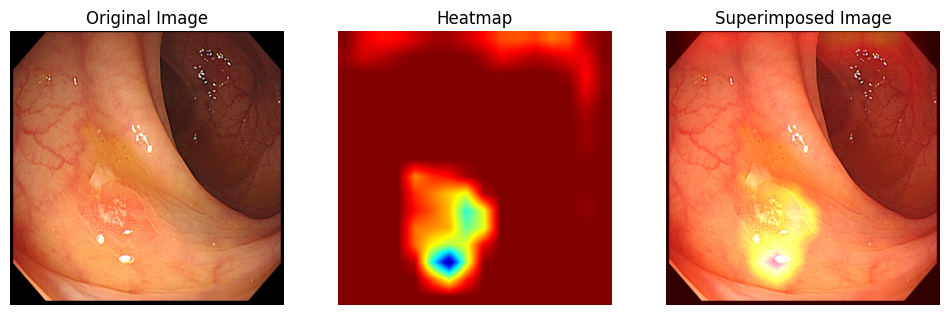

Sample:  2
Actual Label:  Normal
Predicted Label:  Normal
Normal


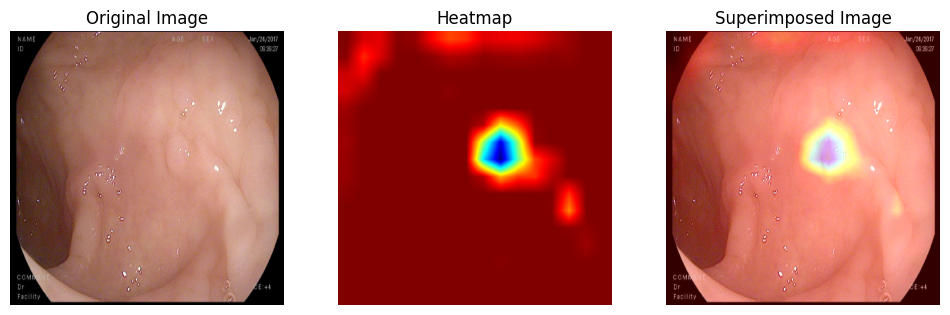

Sample:  3
Actual Label:  Normal
Predicted Label:  Normal
Normal


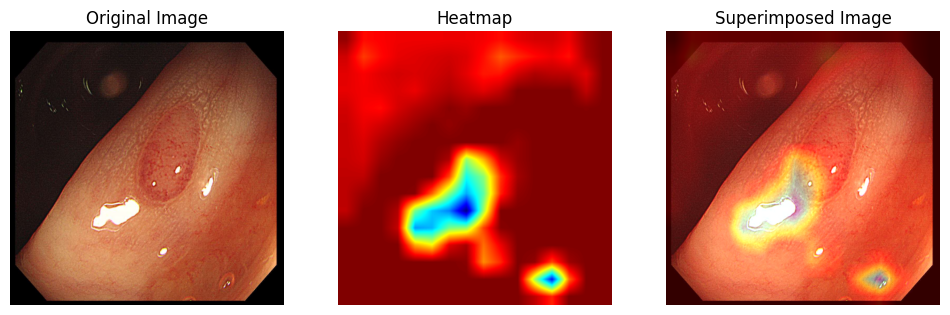

Sample:  4
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


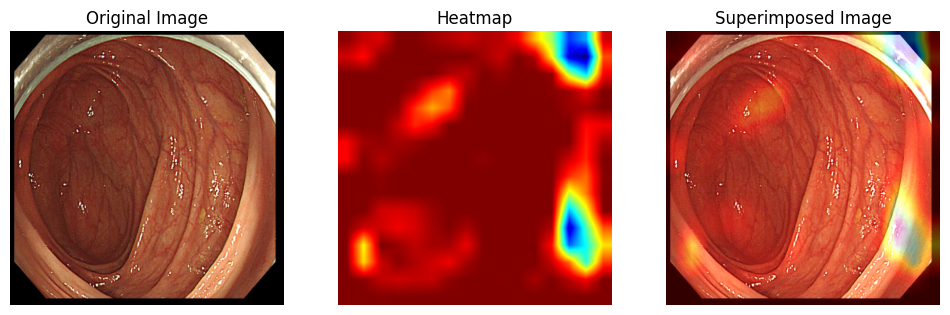

Sample:  5
Actual Label:  Normal
Predicted Label:  Normal
Normal


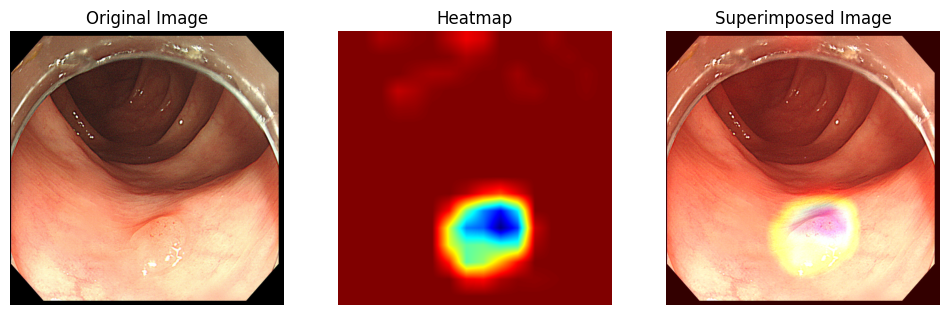

************************************************************
Accuracy: Mean = 94.3925, Std = 0.0000
Precision: Mean = 94.3833, Std = 0.0000
Recall: Mean = 94.4143, Std = 0.0000
F1 Score: Mean = 94.3906, Std = 0.0000
Kappa: Mean = 88.7821, Std = 0.0000


In [25]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 25
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='se')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'attention_block'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Abnormal', 'Normal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)
    break

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")


## Spatial

Fold 1:
[INFO] Training network for 25 epochs...

Epoch 1/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 927ms/step - accuracy: 0.6637 - loss: 0.6277
Epoch 1: val_accuracy improved from -inf to 0.48598, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - accuracy: 0.6647 - loss: 0.6266 - val_accuracy: 0.4860 - val_loss: 0.7892 - learning_rate: 0.0010
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.7972 - loss: 0.4654
Epoch 2: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 40s 121ms/step - accuracy: 0.7975 - loss: 0.4645 - val_accuracy: 0.4860 - val_loss: 1.0914 - learning_rate: 0.0010
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.8539 - loss: 0.3641
Epoch 3: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.8542 - loss: 0.3632 - val_accuracy: 0.4860 - val_loss: 2.3468 - learning_rate: 0.0010
Epoch 4/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.8

W0000 00:00:1727974003.840169   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.840701   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.841165   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.841628   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.842108   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.842586   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.843045   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.843518   32715 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1727974003.844028   32715 gp

Abnormal


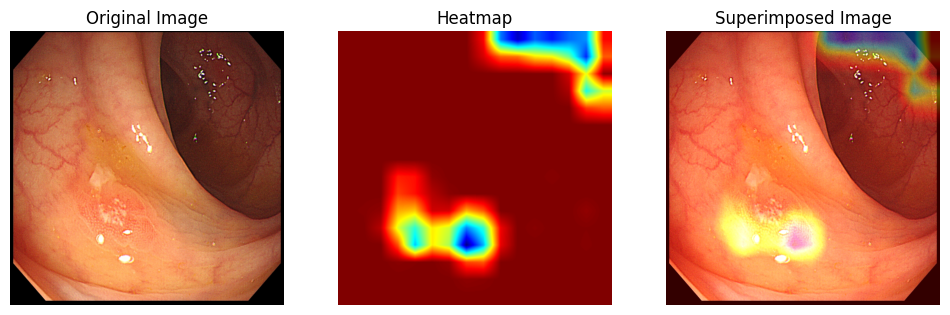

Sample:  2
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


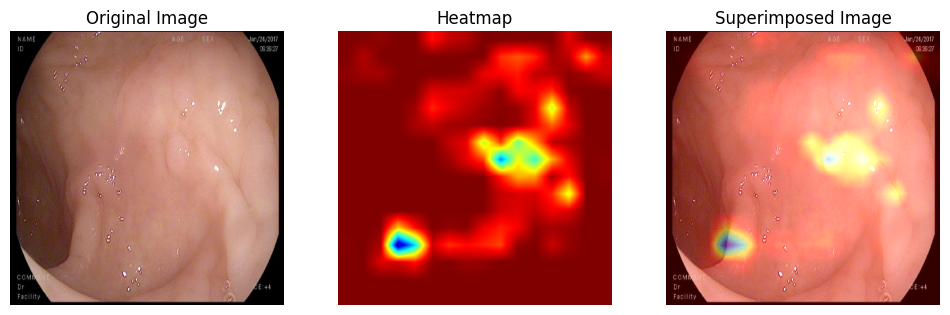

Sample:  3
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


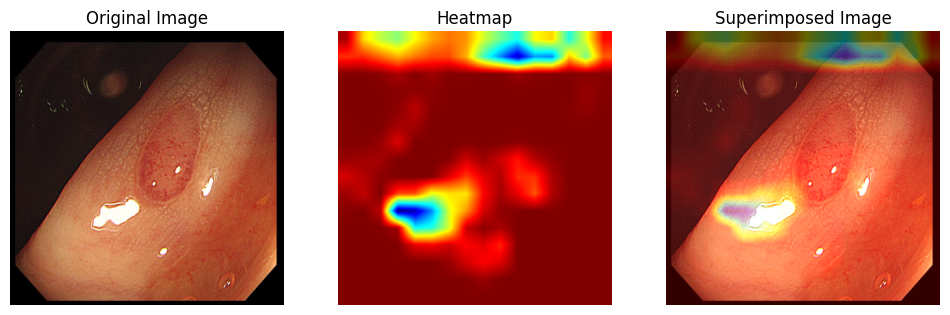

Sample:  4
Actual Label:  Normal
Predicted Label:  Normal
Normal


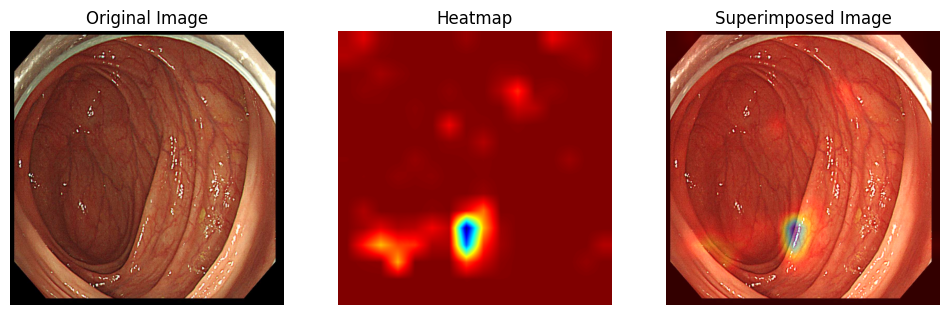

Sample:  5
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


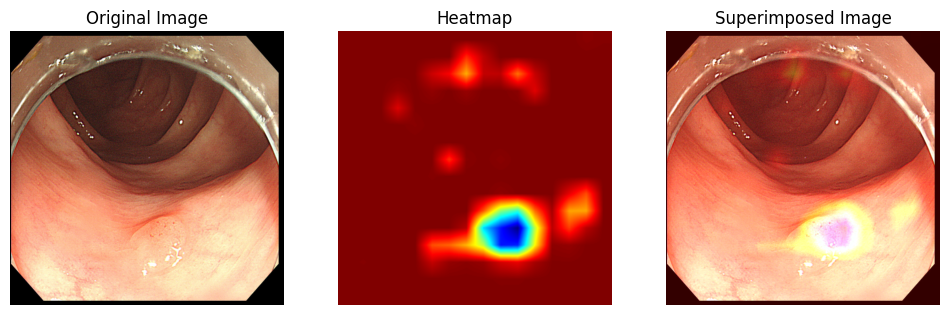

************************************************************
Accuracy: Mean = 88.3178, Std = 0.0000
Precision: Mean = 88.3049, Std = 0.0000
Recall: Mean = 88.3217, Std = 0.0000
F1 Score: Mean = 88.3114, Std = 0.0000
Kappa: Mean = 76.6233, Std = 0.0000


In [26]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 25
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='spatial')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'attention_block'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Normal', 'Abnormal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)
    break

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")


## Non-local

Fold 1:
[INFO] Training network for 20 epochs...

Epoch 1/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 815ms/step - accuracy: 0.5411 - loss: 2.0702
Epoch 1: val_accuracy improved from -inf to 0.50935, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 138s 1s/step - accuracy: 0.5421 - loss: 2.0538 - val_accuracy: 0.5093 - val_loss: 0.6915 - learning_rate: 0.0010
Epoch 2/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - accuracy: 0.5947 - loss: 0.8229
Epoch 2: val_accuracy improved from 0.50935 to 0.59813, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - accuracy: 0.5955 - loss: 0.8204 - val_accuracy: 0.5981 - val_loss: 0.7380 - learning_rate: 0.0010
Epoch 3/20
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.6480 - loss: 0.6363
Epoch 3: val_accuracy improved from 0.59813 to 0.63551, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - accuracy: 0.6491 - loss: 0.6352 - val_accuracy: 0.6355 - val_l

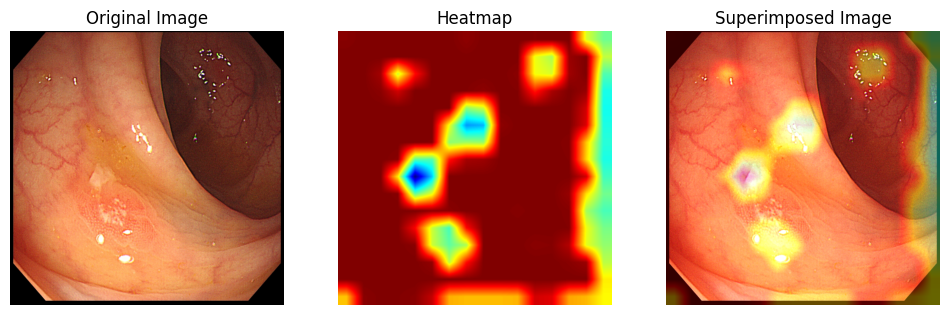

Sample:  2
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


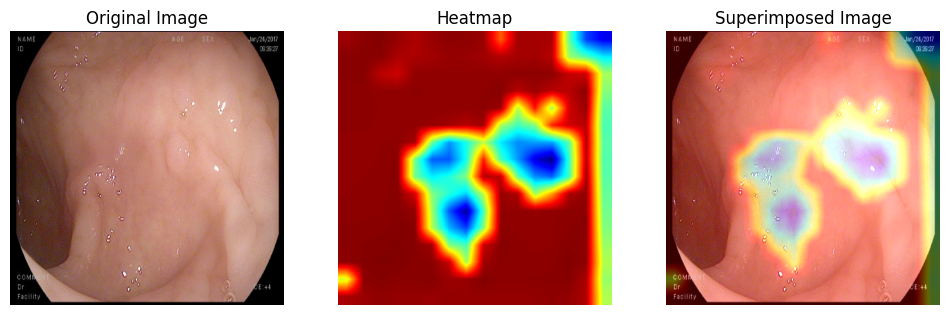

Sample:  3
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


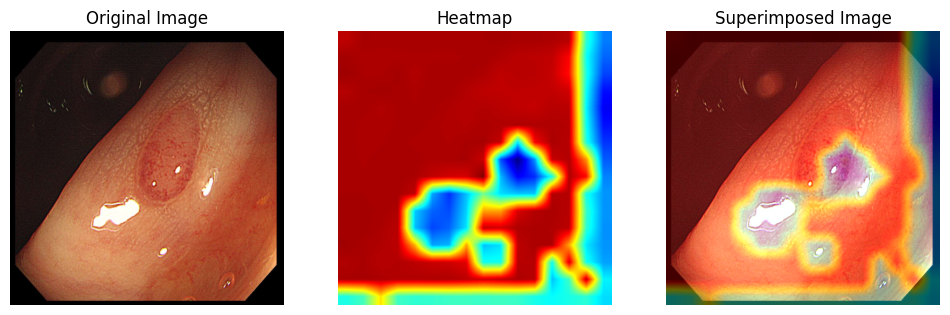

Sample:  4
Actual Label:  Normal
Predicted Label:  Normal
Normal


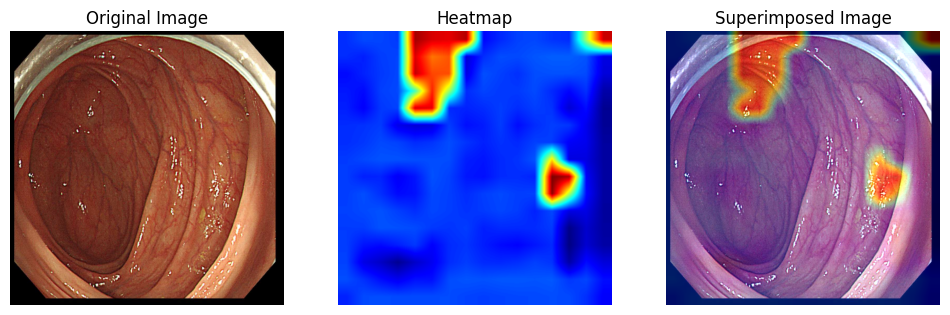

Sample:  5
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


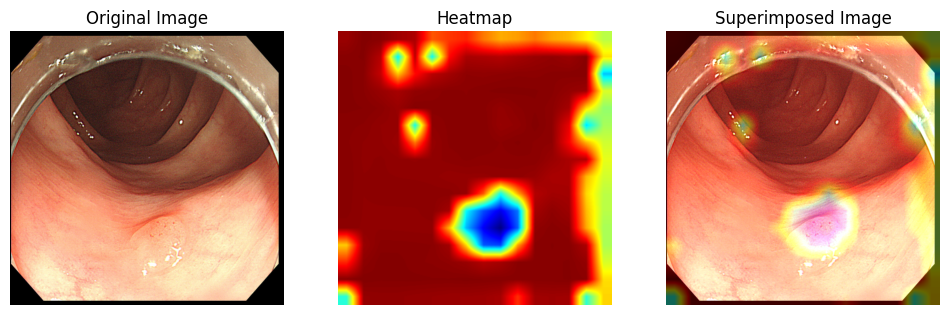

************************************************************
Accuracy: Mean = 81.7757, Std = 0.0000
Precision: Mean = 81.9235, Std = 0.0000
Recall: Mean = 81.6696, Std = 0.0000
F1 Score: Mean = 81.7082, Std = 0.0000
Kappa: Mean = 63.4556, Std = 0.0000


In [13]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 20
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='non_local')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'attention_block'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Normal', 'Abnormal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)
    
    break

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")

## GC

Fold 1:
[INFO] Training network for 25 epochs...

Epoch 1/25


/home/users/syellu1/.conda/envs/conda_env/lib/python3.9/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 256, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 954ms/step - accuracy: 0.5334 - loss: 12.5205
Epoch 1: val_accuracy improved from -inf to 0.42056, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - accuracy: 0.5341 - loss: 12.3796 - val_accuracy: 0.4206 - val_loss: 2.6309 - learning_rate: 0.0010
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.6860 - loss: 0.6353
Epoch 2: val_accuracy improved from 0.42056 to 0.68224, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 8s 138ms/step - accuracy: 0.6863 - loss: 0.6349 - val_accuracy: 0.6822 - val_loss: 0.5837 - learning_rate: 0.0010
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.7743 - loss: 0.5127
Epoch 3: val_accuracy did not improve from 0.68224
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - accuracy: 0.7744 - loss: 0.5122 - val_accuracy: 0.6121 - val_loss: 0.7293 - learning_rate: 0.0010
Epoch 4/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.7939 - lo

/home/users/syellu1/.conda/envs/conda_env/lib/python3.9/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 256, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
****************************** Fold-1 Metrics ******************************
Accuracy:  88.32
Macro Precision:  88.52
Macro Recall:  88.22
Macro F1-Score:  88.27
Quadratic Kappa Score:  76.57

Confusion Matrix: 
 [[101   9]
 [ 16  88]]

Classification Report:
               precision    recall  f1-score   support

           0     0.8632    0.9182    0.8899       110
           1     0.9072    0.8462    0.8756       104

    accuracy                         0.8832       214
   macro avg     0.8852    0.8822    0.8827       214
weighted avg     0.8846    0.8832    0.8829       214

Sample:  1
Actual Label:  Abnormal
Predicted Label:  Abnormal


/home/users/syellu1/.conda/envs/conda_env/lib/python3.9/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (1, 256, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Abnormal


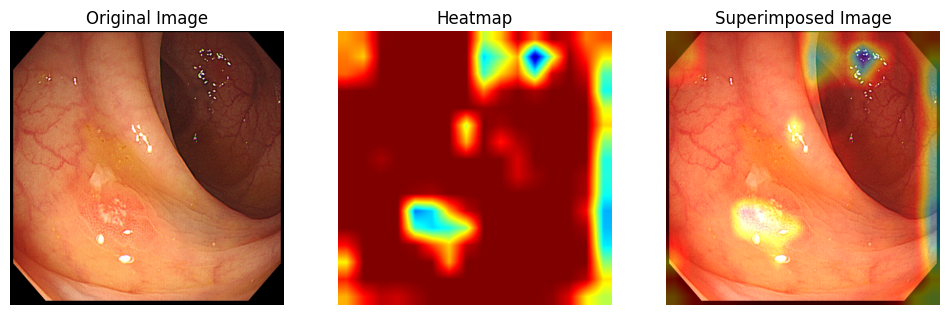

Sample:  2
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


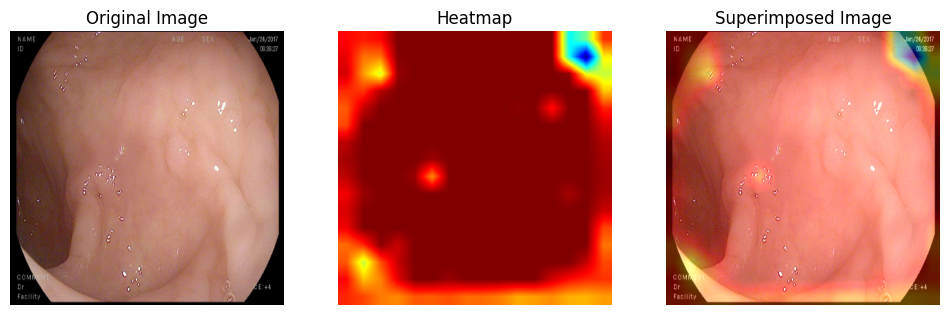

Sample:  3
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


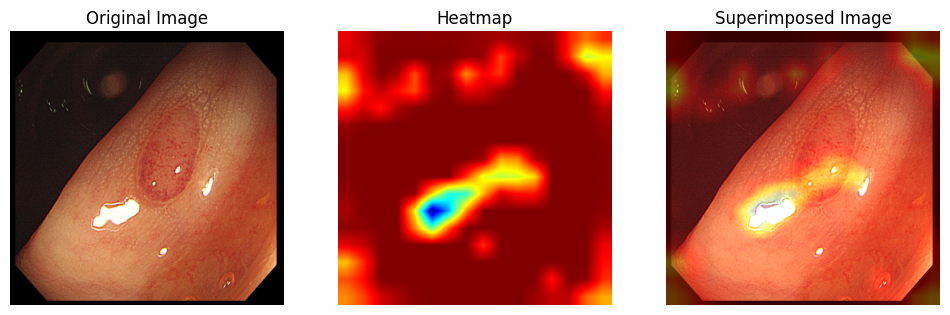

Sample:  4
Actual Label:  Normal
Predicted Label:  Normal
Normal


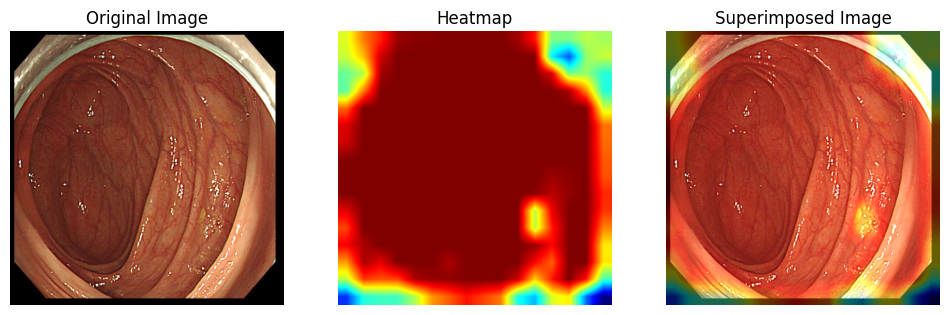

Sample:  5
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


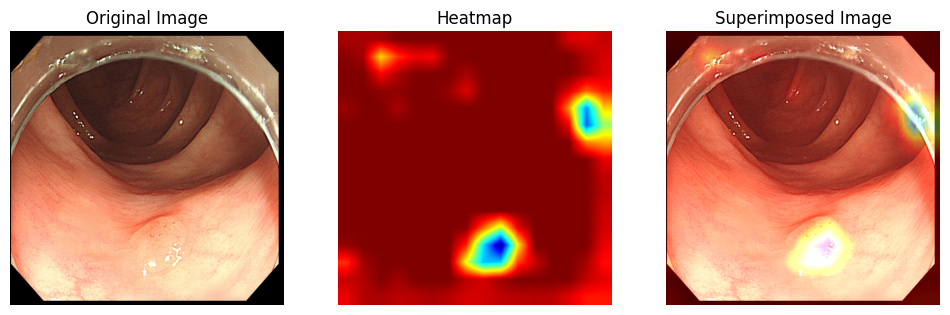

************************************************************
Accuracy: Mean = 88.3178, Std = 0.0000
Precision: Mean = 88.5232, Std = 0.0000
Recall: Mean = 88.2168, Std = 0.0000
F1 Score: Mean = 88.2745, Std = 0.0000
Kappa: Mean = 76.5741, Std = 0.0000


In [28]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 25
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='gc')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'attention_block'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Normal', 'Abnormal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)
    break

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")

## Self-attention

Fold 1:
[INFO] Training network for 25 epochs...

Epoch 1/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 929ms/step - accuracy: 0.5551 - loss: 1.8902
Epoch 1: val_accuracy improved from -inf to 0.48598, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - accuracy: 0.5565 - loss: 1.8755 - val_accuracy: 0.4860 - val_loss: 1.1128 - learning_rate: 0.0010
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.7375 - loss: 0.6143
Epoch 2: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.7387 - loss: 0.6115 - val_accuracy: 0.4860 - val_loss: 1.2424 - learning_rate: 0.0010
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.8151 - loss: 0.4466
Epoch 3: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.8156 - loss: 0.4452 - val_accuracy: 0.4860 - val_loss: 0.8687 - learning_rate: 0.0010
Epoch 4/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.80

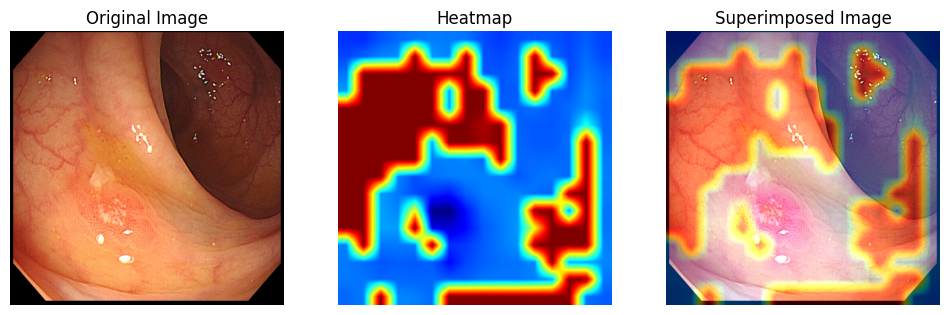

Sample:  2
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


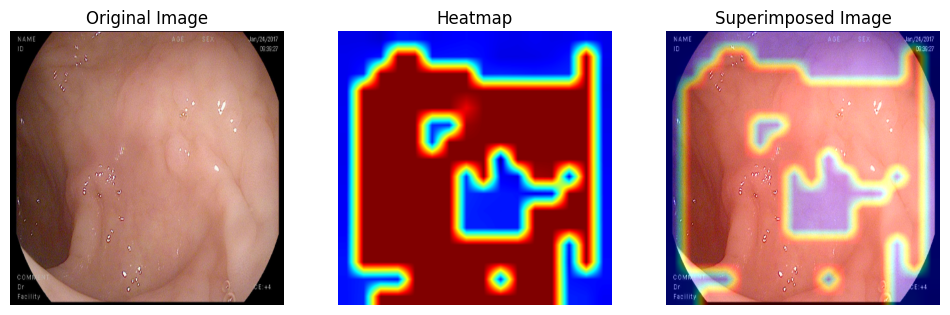

Sample:  3
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


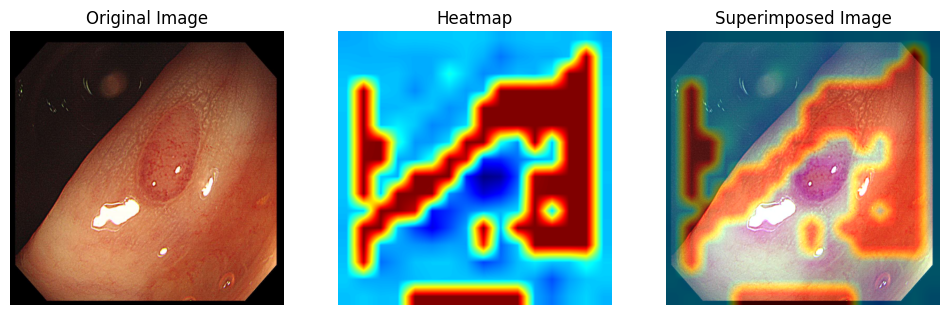

Sample:  4
Actual Label:  Normal
Predicted Label:  Normal
Normal


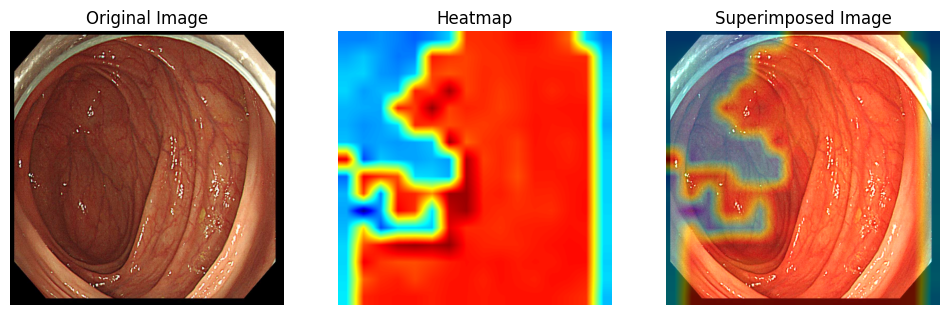

Sample:  5
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


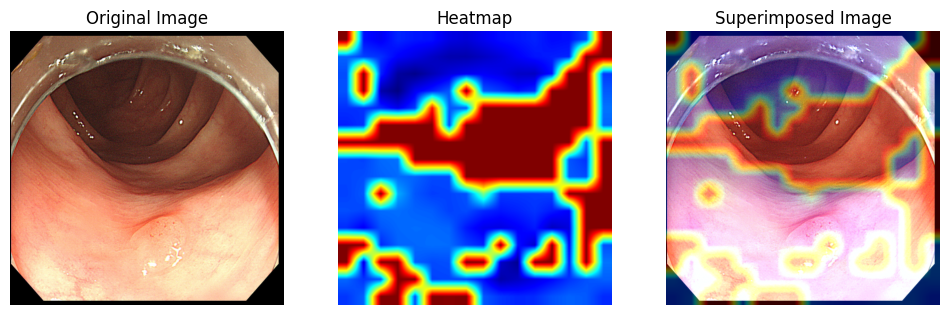

************************************************************
Accuracy: Mean = 90.6542, Std = 0.0000
Precision: Mean = 90.9428, Std = 0.0000
Recall: Mean = 90.5420, Std = 0.0000
F1 Score: Mean = 90.6140, Std = 0.0000
Kappa: Mean = 81.2544, Std = 0.0000


In [29]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 25
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='self_attention')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'attention_block'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Normal', 'Abnormal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)
    break

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")

## Gated-Attention

Fold 1:


[INFO] Training network for 25 epochs...

Epoch 1/25
53/54 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 0.6559 - loss: 0.6194

2024-10-03 17:07:05.979938: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.54GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-10-03 17:07:05.980000: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.54GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 943ms/step - accuracy: 0.6576 - loss: 0.6179
Epoch 1: val_accuracy improved from -inf to 0.48598, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 156s 1s/step - accuracy: 0.6593 - loss: 0.6165 - val_accuracy: 0.4860 - val_loss: 0.9630 - learning_rate: 0.0010
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.8215 - loss: 0.4150
Epoch 2: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - accuracy: 0.8219 - loss: 0.4142 - val_accuracy: 0.4860 - val_loss: 2.2005 - learning_rate: 0.0010
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.8860 - loss: 0.3041
Epoch 3: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 0.8864 - loss: 0.3030 - val_accuracy: 0.4860 - val_loss: 2.1125 - learning_rate: 0.0010
Epoch 4/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.9222 - loss: 0.2077
Epoch 4: val_accuracy improved from 0.48598

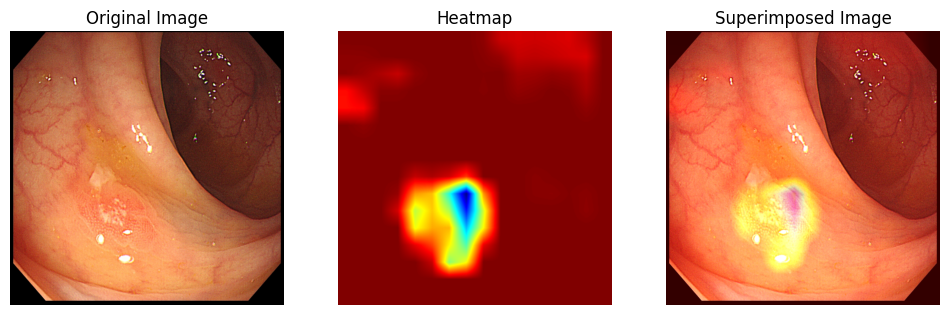

Sample:  2
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


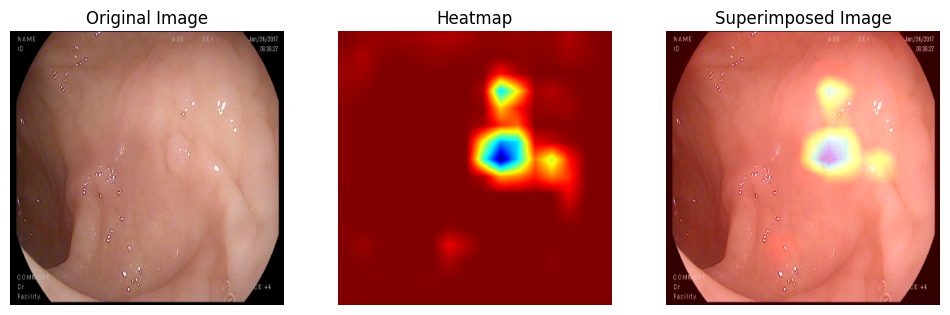

Sample:  3
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


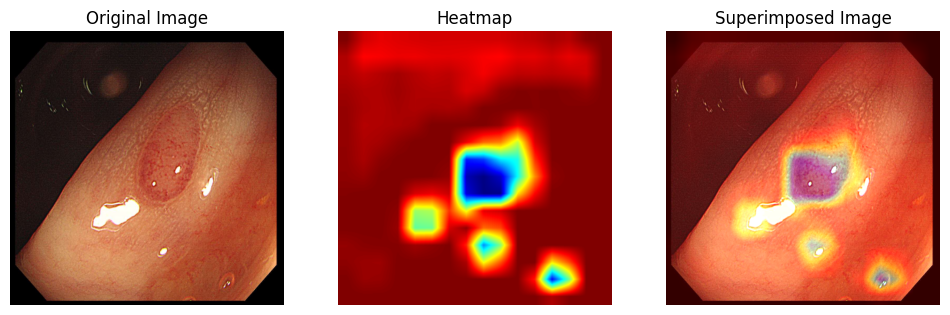

Sample:  4
Actual Label:  Normal
Predicted Label:  Normal
Normal


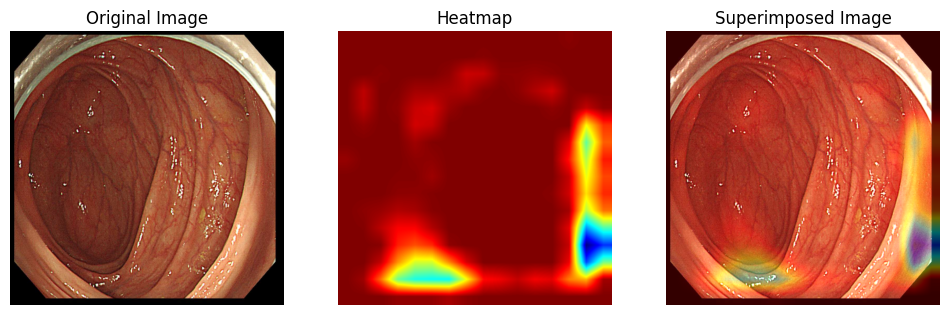

Sample:  5
Actual Label:  Abnormal
Predicted Label:  Abnormal
Abnormal


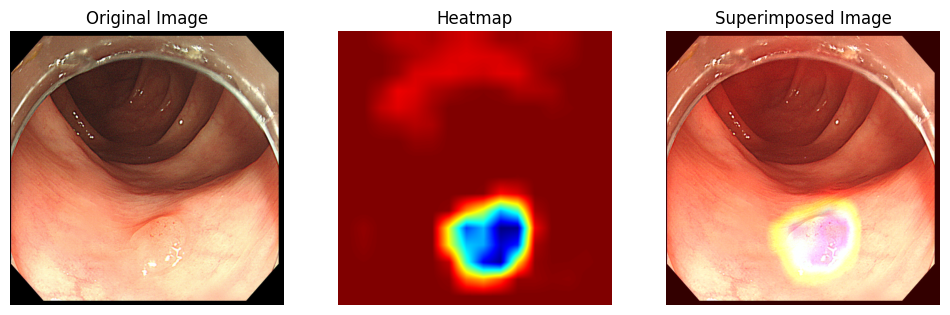

************************************************************
Accuracy: Mean = 92.5234, Std = 0.0000
Precision: Mean = 92.5402, Std = 0.0000
Recall: Mean = 92.5699, Std = 0.0000
F1 Score: Mean = 92.5227, Std = 0.0000
Kappa: Mean = 85.0506, Std = 0.0000


In [30]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 25
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='gated_attention')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'attention_block'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Normal', 'Abnormal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)
    break

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")

## DCAN

In [11]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Conv2D, Activation, Softmax, Multiply, Add

class DynamicContextualAttention(Layer):
    def __init__(self, filters, kernel_size, activation='relu', **kwargs):
        super(DynamicContextualAttention, self).__init__(**kwargs)
        self.filters = filters
        self.kernel_size = kernel_size
        self.activation = Activation(activation)
        
    def build(self, input_shape):
        self.conv_layer = Conv2D(self.filters, self.kernel_size, padding='same')
        self.conv_activation = self.activation
        self.conv_softmax = Softmax(axis=[1, 2])
        
        # Additional layers for temporal attention
        self.temporal_conv = Conv2D(1, (1, 1), padding='same')
        self.temporal_softmax = Softmax(axis=-1)
        
        self.adaptive_conv = Conv2D(1, (1, 1), padding='same')
        self.adaptive_activation = Activation('sigmoid')
        
        super(DynamicContextualAttention, self).build(input_shape)
    
    def call(self, inputs):
        # Spatial attention
        spatial_features = self.conv_activation(self.conv_layer(inputs))
        spatial_attention = self.conv_softmax(spatial_features)
        
        # Temporal attention
        temporal_features = self.temporal_conv(inputs)
        temporal_attention = self.temporal_softmax(temporal_features)
        
        # Hierarchical fusion
        attention_weights = Multiply()([spatial_attention, temporal_attention])
        
        # Adaptive attention refinement
        adaptive_weights = self.adaptive_activation(self.adaptive_conv(inputs))
        refined_attention = Add()([attention_weights, adaptive_weights])
        
        # Multiply attention maps with input
        attended_inputs = Multiply()([refined_attention, inputs])
        
        return attended_inputs
    
    def compute_output_shape(self, input_shape):
        return input_shape  # Output shape same as input shape
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'filters': self.filters,
            'kernel_size': self.kernel_size,
            'activation': self.activation,
        })
        return config

In [14]:
# Hyper-parameters
input_shape = (512, 512, 3)
EPOCHS = 25
batch_size = 16  # Adjusted for potential memory constraints

# Lists to store metrics
accuracy_list, precision_list, recall_list, f1_list, kappa_list = [], [], [], [], []

for fold in range(folds):
    X_train, X_test = X[fold]
    y_train, y_test = y[fold]

    print(f"Fold {fold+1}:")

    # Create an instance of the DCAN model with the desired attention mechanism
    model = DCANModel(input_shape=input_shape, num_classes=2, attention_type='DCAN')  # Change 'se' to desired attention type
    filepath = f"working/Polyp_DCAN_fold{fold}.keras"
    
    # Compile the model
    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    # Normalize the data if not already done
    X_train = X_train.astype('float32') / 255.0
    X_test = X_test.astype('float32') / 255.0

    # Define the necessary callbacks
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    earlystopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, mode='max', restore_best_weights=True)
    rlrop = ReduceLROnPlateau(monitor='val_accuracy', mode='max', patience=5, factor=0.5, min_lr=1e-6, verbose=1)

    callbacks = [checkpoint, rlrop, earlystopping]

    print(f"[INFO] Training network for {EPOCHS} epochs...\n")
    hist = model.fit(X_train, y_train, batch_size=batch_size, validation_data=(X_test, y_test), epochs=EPOCHS, callbacks=callbacks)
    
    # Plot training & validation accuracy and loss values
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Accuracy plot
    axs[0].plot(hist.history['accuracy'])
    axs[0].plot(hist.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')
    
    # Loss plot
    axs[1].plot(hist.history['loss'])
    axs[1].plot(hist.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')
    
    plt.savefig(f'Training_Validation_Plot_Fold_{fold+1}.png')
    plt.close()

    # Load the best weights
    model.load_weights(filepath)
    
    # Evaluate the model
    y_score = model.predict(X_test)
    y_pred = np.argmax(y_score, axis=-1)
    Y_test = np.argmax(y_test, axis=-1)
    
    acc = accuracy_score(Y_test, y_pred)
    mpre = precision_score(Y_test, y_pred, average='macro')
    mrecall = recall_score(Y_test, y_pred, average='macro')
    mf1 = f1_score(Y_test, y_pred, average='macro')
    kappa = cohen_kappa_score(Y_test, y_pred, weights='quadratic')
    
    accuracy_list.append(acc)
    precision_list.append(mpre)
    recall_list.append(mrecall)
    f1_list.append(mf1)
    kappa_list.append(kappa)
    
    print("*" * 30, f"Fold-{fold+1} Metrics", "*" * 30)
    print("Accuracy: ", round(acc * 100, 2))
    print("Macro Precision: ", round(mpre * 100, 2))
    print("Macro Recall: ", round(mrecall * 100, 2))
    print("Macro F1-Score: ", round(mf1 * 100, 2))
    print("Quadratic Kappa Score: ", round(kappa * 100, 2))
    print("\nConfusion Matrix: \n", confusion_matrix(Y_test, y_pred))
    print("\nClassification Report:\n", classification_report(Y_test, y_pred, digits=4))
    
    # Visualization of attention maps
    import random
    random.seed(360)
    
    att_layer_name = 'dynamic_contextual_attention'  # Must match the layer name in the model
    num_imgs = 5  # Reduced for brevity
    img_indxs = random.sample(range(0, X_test.shape[0]), num_imgs)
    
    labels = ['Normal', 'Abnormal']
    counter = 1
    for indx in img_indxs:
        img = X_test[indx]
        print("Sample: ", counter)
        print("Actual Label: ", labels[np.argmax(y_test[indx])])
        pred = np.argmax(model.predict(np.expand_dims(img, axis=0), verbose=0), axis=-1)[0]
        print("Predicted Label: ", labels[pred])
        # Generate Grad-CAM++ heatmap
        heatmap_plus = grad_cam_plus(model, img, att_layer_name, label_name=labels, category_id=np.argmax(y_test[indx]))
        show_GradCAM(img, heatmap_plus)
        counter += 1
    
    print("*" * 60)

# Calculate mean and std for each metric
accuracy_mean, accuracy_std = np.mean(accuracy_list), np.std(accuracy_list)
precision_mean, precision_std = np.mean(precision_list), np.std(precision_list)
recall_mean, recall_std = np.mean(recall_list), np.std(recall_list)
f1_mean, f1_std = np.mean(f1_list), np.std(f1_list)
kappa_mean, kappa_std = np.mean(kappa_list), np.std(kappa_list)

# Print the overall results
print(f"Accuracy: Mean = {accuracy_mean*100:.4f}, Std = {accuracy_std*100:.4f}")
print(f"Precision: Mean = {precision_mean*100:.4f}, Std = {precision_std*100:.4f}")
print(f"Recall: Mean = {recall_mean*100:.4f}, Std = {recall_std*100:.4f}")
print(f"F1 Score: Mean = {f1_mean*100:.4f}, Std = {f1_std*100:.4f}")
print(f"Kappa: Mean = {kappa_mean*100:.4f}, Std = {kappa_std*100:.4f}")

Fold 1:
[INFO] Training network for 25 epochs...

Epoch 1/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 857ms/step - accuracy: 0.6380 - loss: 0.6479
Epoch 1: val_accuracy improved from -inf to 0.48598, saving model to working/Polyp_DCAN_fold0.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.6395 - loss: 0.6463 - val_accuracy: 0.4860 - val_loss: 2.0646 - learning_rate: 0.0010
Epoch 2/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.8189 - loss: 0.4453
Epoch 2: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.8194 - loss: 0.4443 - val_accuracy: 0.4860 - val_loss: 1.2801 - learning_rate: 0.0010
Epoch 3/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - accuracy: 0.8408 - loss: 0.3705
Epoch 3: val_accuracy did not improve from 0.48598
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.8414 - loss: 0.3695 - val_accuracy: 0.4860 - val_loss: 1.2211 - learning_rate: 0.0010
Epoch 4/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.89

ValueError: No such layer: dynamic_contextual_attention. Existing layers are: ['input_layer_23', 'rescaling_11', 'normalization_11', 'stem_conv', 'stem_bn', 'stem_activation', 'block1a_project_conv', 'block1a_project_bn', 'block1a_project_activation', 'block2a_expand_conv', 'block2a_expand_bn', 'block2a_expand_activation', 'block2a_project_conv', 'block2a_project_bn', 'block2b_expand_conv', 'block2b_expand_bn', 'block2b_expand_activation', 'block2b_project_conv', 'block2b_project_bn', 'block2b_drop', 'block2b_add', 'block3a_expand_conv', 'block3a_expand_bn', 'block3a_expand_activation', 'block3a_project_conv', 'block3a_project_bn', 'block3b_expand_conv', 'block3b_expand_bn', 'block3b_expand_activation', 'block3b_project_conv', 'block3b_project_bn', 'block3b_drop', 'block3b_add', 'block4a_expand_conv', 'block4a_expand_bn', 'block4a_expand_activation', 'block4a_dwconv2', 'block4a_bn', 'block4a_activation', 'block4a_se_squeeze', 'block4a_se_reshape', 'block4a_se_reduce', 'block4a_se_expand', 'block4a_se_excite', 'block4a_project_conv', 'block4a_project_bn', 'block4b_expand_conv', 'block4b_expand_bn', 'block4b_expand_activation', 'block4b_dwconv2', 'block4b_bn', 'block4b_activation', 'block4b_se_squeeze', 'block4b_se_reshape', 'block4b_se_reduce', 'block4b_se_expand', 'block4b_se_excite', 'block4b_project_conv', 'block4b_project_bn', 'block4b_drop', 'block4b_add', 'block4c_expand_conv', 'block4c_expand_bn', 'block4c_expand_activation', 'block4c_dwconv2', 'block4c_bn', 'block4c_activation', 'block4c_se_squeeze', 'block4c_se_reshape', 'block4c_se_reduce', 'block4c_se_expand', 'block4c_se_excite', 'block4c_project_conv', 'block4c_project_bn', 'block4c_drop', 'block4c_add', 'block5a_expand_conv', 'block5a_expand_bn', 'block5a_expand_activation', 'block5a_dwconv2', 'block5a_bn', 'block5a_activation', 'block5a_se_squeeze', 'block5a_se_reshape', 'block5a_se_reduce', 'block5a_se_expand', 'block5a_se_excite', 'block5a_project_conv', 'block5a_project_bn', 'block5b_expand_conv', 'block5b_expand_bn', 'block5b_expand_activation', 'block5b_dwconv2', 'block5b_bn', 'block5b_activation', 'block5b_se_squeeze', 'block5b_se_reshape', 'block5b_se_reduce', 'block5b_se_expand', 'block5b_se_excite', 'block5b_project_conv', 'block5b_project_bn', 'block5b_drop', 'block5b_add', 'block5c_expand_conv', 'block5c_expand_bn', 'block5c_expand_activation', 'block5c_dwconv2', 'block5c_bn', 'block5c_activation', 'block5c_se_squeeze', 'block5c_se_reshape', 'block5c_se_reduce', 'block5c_se_expand', 'block5c_se_excite', 'block5c_project_conv', 'block5c_project_bn', 'block5c_drop', 'block5c_add', 'block5d_expand_conv', 'block5d_expand_bn', 'block5d_expand_activation', 'block5d_dwconv2', 'block5d_bn', 'block5d_activation', 'block5d_se_squeeze', 'block5d_se_reshape', 'block5d_se_reduce', 'block5d_se_expand', 'block5d_se_excite', 'block5d_project_conv', 'block5d_project_bn', 'block5d_drop', 'block5d_add', 'block5e_expand_conv', 'block5e_expand_bn', 'block5e_expand_activation', 'block5e_dwconv2', 'block5e_bn', 'block5e_activation', 'block5e_se_squeeze', 'block5e_se_reshape', 'block5e_se_reduce', 'block5e_se_expand', 'block5e_se_excite', 'block5e_project_conv', 'block5e_project_bn', 'block5e_drop', 'block5e_add', 'block6a_expand_conv', 'block6a_expand_bn', 'block6a_expand_activation', 'block6a_dwconv2', 'block6a_bn', 'block6a_activation', 'block6a_se_squeeze', 'block6a_se_reshape', 'block6a_se_reduce', 'block6a_se_expand', 'block6a_se_excite', 'block6a_project_conv', 'block6a_project_bn', 'block6b_expand_conv', 'block6b_expand_bn', 'block6b_expand_activation', 'block6b_dwconv2', 'block6b_bn', 'block6b_activation', 'block6b_se_squeeze', 'block6b_se_reshape', 'block6b_se_reduce', 'block6b_se_expand', 'block6b_se_excite', 'block6b_project_conv', 'block6b_project_bn', 'block6b_drop', 'block6b_add', 'block6c_expand_conv', 'block6c_expand_bn', 'block6c_expand_activation', 'block6c_dwconv2', 'block6c_bn', 'block6c_activation', 'block6c_se_squeeze', 'block6c_se_reshape', 'block6c_se_reduce', 'block6c_se_expand', 'block6c_se_excite', 'block6c_project_conv', 'block6c_project_bn', 'block6c_drop', 'block6c_add', 'block6d_expand_conv', 'block6d_expand_bn', 'block6d_expand_activation', 'block6d_dwconv2', 'block6d_bn', 'block6d_activation', 'block6d_se_squeeze', 'block6d_se_reshape', 'block6d_se_reduce', 'block6d_se_expand', 'block6d_se_excite', 'block6d_project_conv', 'block6d_project_bn', 'block6d_drop', 'block6d_add', 'block6e_expand_conv', 'block6e_expand_bn', 'block6e_expand_activation', 'block6e_dwconv2', 'block6e_bn', 'block6e_activation', 'block6e_se_squeeze', 'block6e_se_reshape', 'block6e_se_reduce', 'block6e_se_expand', 'block6e_se_excite', 'block6e_project_conv', 'block6e_project_bn', 'block6e_drop', 'block6e_add', 'block6f_expand_conv', 'block6f_expand_bn', 'block6f_expand_activation', 'block6f_dwconv2', 'block6f_bn', 'block6f_activation', 'block6f_se_squeeze', 'block6f_se_reshape', 'block6f_se_reduce', 'block6f_se_expand', 'block6f_se_excite', 'block6f_project_conv', 'block6f_project_bn', 'block6f_drop', 'block6f_add', 'block6g_expand_conv', 'block6g_expand_bn', 'block6g_expand_activation', 'block6g_dwconv2', 'block6g_bn', 'block6g_activation', 'block6g_se_squeeze', 'block6g_se_reshape', 'block6g_se_reduce', 'block6g_se_expand', 'block6g_se_excite', 'block6g_project_conv', 'block6g_project_bn', 'block6g_drop', 'block6g_add', 'block6h_expand_conv', 'block6h_expand_bn', 'block6h_expand_activation', 'block6h_dwconv2', 'block6h_bn', 'block6h_activation', 'block6h_se_squeeze', 'block6h_se_reshape', 'block6h_se_reduce', 'block6h_se_expand', 'block6h_se_excite', 'block6h_project_conv', 'block6h_project_bn', 'block6h_drop', 'block6h_add', 'top_conv', 'top_bn', 'top_activation', 'global_average_pooling2d_11', 'dense_22', 'dense_23'].